## Рынок заведений общественного питания Москвы
Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import json
from folium import Map, Choropleth
import warnings
warnings.filterwarnings('ignore')

### Откроем файл с данными

Сохраним датасет в переменную rest.

In [2]:
rest=pd.read_csv('/datasets/moscow_places.csv')
display(rest)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


### Предобработка данных

####  Изменение типов данных

Запросив информацию по датафрейму и ознакомившись с ней, мы приняли решение ничего не менять. В том ччисле и по той причине, что у нас нет данных для заполнения пропусков в следующих столбцах  middle_avg_bill, middle_coffee_cup, seats. Эти данные важны для дальнейших исследований.

In [3]:
print(rest.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


####  Изучим пропуски и избавимся от них

Пропуски в столбце с указанием графика работы. Эти данные необходимы для дальнейшего исследования. Так как пропусков незначительное количество, мы просто избавися от них.

Пропуски в столбце с категорией цен в заведении заполним значением нет. 

Тоже сделаем со столбцом средней стоимости заказа.

Столбец middle_avg_bill, middle_coffee_cup, seats трогать не будем, так как этот столбец важен для дальнейшего исследования и заполнение его средним значением может исказить результаты.

In [4]:
rest.isna().sum()
rest['hours']=rest['hours'].fillna(0)
rest.dropna(subset=['hours'])
rest['price']=rest['price'].fillna('нет')
rest['avg_bill']=rest['avg_bill'].fillna('нет')
rest.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

#### Дубликаты

Проверим наличие полных дубликатов в таблице.

Убирать дубликаты среди названий будет неправильным, так как это могут быть разные заведения имеющие одинаковые названия, но разные адреса и прочие данные.

In [5]:
rest.duplicated().sum()

0

#### Категориальные значения

Для удобства работы приведем к единому регистру названия заведений и адреса.

In [6]:
rest['name']=rest['name'].str.lower()
rest['address']=rest['address'].str.lower()

#### Добавление новых столбцов

##### Добавление столбца с названием улицы, на которой находится заведение

In [7]:
pattern = '\,*,(([а-яА-Я1-9\-ё\s"]+)?(улица|переулок|шоссе|проспект|площадь|проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|)([а-яА-Яё1-9\-\s"]+)?)\,'
rest['street']=rest['address'].str.extract(pat=pattern)[0]

##### Добавление столбца с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [8]:
def mode (x):
    if (str(x).find('круглосуточно')!= -1) and (str(x).find('ежедневно')!= -1):
        return True
    else:
        return False
rest['is_24/7']=rest['hours'].apply(mode)
display(rest)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет,нет,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,нет,нет,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,нет,нет,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,нет,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,нет,нет,NaN,NaN,1,150.0,люблинская улица,True


### Исследовательский анализ данных

#### Изучение категории заведений

Для начала посмотрим какие категории заведений общественного питания представлены в нашем датафрейме. Запросим уникальные значения столбца с категорией. встречаются следующие категории 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая'.

Теперь посмотрим на колличество объектов общественного питания в зависимости от той или иной категории:

Видим что больше всего заведений в категории "кафе", их 2378 штук. Далее по распространенности идут "рестораны", их 2043 штуки. Чуть меньше заведений с категорией "кофейня", 1413 штук. Немного заведениий с категорией "столовая", их 315 штук. Меньше всего открыто "булочная", 256 штук.

Посчитаем какой процентр от общего колличества заведений составляет та или иная категория.

Для наглядности постороим круговую диаграмму, где будет видно распределение.

          category  rest_count  ratio
0             кафе        2378   28.0
1         ресторан        2043   24.0
2          кофейня        1413   17.0
3          бар,паб         765    9.0
4         пиццерия         633    8.0
5  быстрое питание         603    7.0
6         столовая         315    4.0
7         булочная         256    3.0


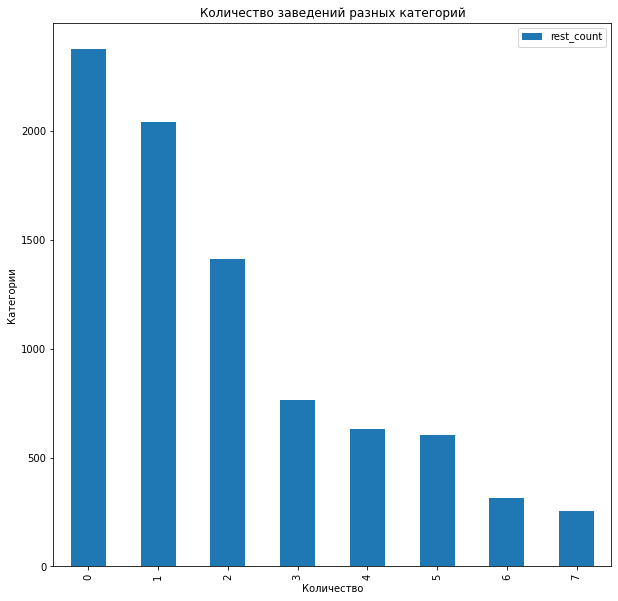

In [80]:
rest['category'].unique()
rest_category=rest.pivot_table(index='category',values='name',aggfunc='count')
rest_category.columns=['rest_count']
rest_category=rest_category.sort_values(by='rest_count',ascending=False)
rest_category=rest_category.reset_index()
rest_category['ratio']=round(rest_category['rest_count']*100/8406)
print(rest_category)
rest_category.plot(kind='bar',figsize=(10, 10),y='rest_count')
plt.title('Количество заведений разных категорий')
plt.xlabel('Количество')
plt.ylabel('Категории')
plt.show()

#### Исследование количества посадочных мест в зависимости от категории заведения

Построим таблицу, где будет видно колличество заведений в каждой категории и среднее колличество посадочных мест в этих заведениях.

Соблюдена закономерность, что чем больше заведений, тем больше и общее количество посадочных мест. Самой популярной категорией у нас оказались кафе, но к сожалению для многих из них не было указано кличество посадочных мест. Самая полная информация оказалась для ресторанов. Тут среднее количество посадочных мест указано для 1270 заведений, и посадочных мест в среднем 86. В кафе эта информация указана для 1218 заведений, среднее количество посадочных мест 60. Меньше всего булочных 148 штук, посадочных мест 50.
Это говорит о том что рестораны обычно имеют большие площади и расчитаны на достаточно большое количество посетителей. тогда как кафе бывают как среднего размера, так и совсем не большие.

          category  rest_count  seats_median
0         ресторан        1270          86.0
1          бар,паб         468          82.5
2          кофейня         751          80.0
3         столовая         164          75.5
4  быстрое питание         349          65.0
5             кафе        1218          60.0
6         пиццерия         427          55.0
7         булочная         148          50.0


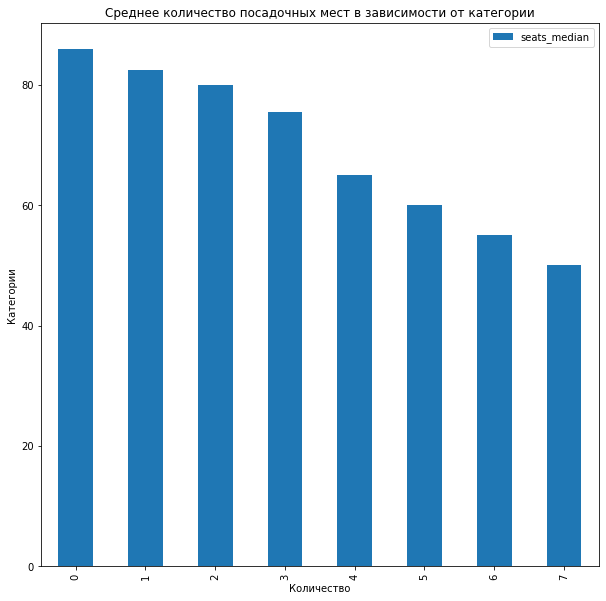

In [75]:
rest_seats=rest.pivot_table(index='category',values='seats',aggfunc=['count','median'])
rest_seats.columns=['rest_count','seats_median']
rest_seats=rest_seats.sort_values(by='seats_median',ascending=False)
rest_seats=rest_seats.reset_index()
print(rest_seats)
rest_seats.plot(kind='bar',figsize=(10, 10),y='seats_median')
plt.title('Среднее количество посадочных мест в зависимости от категории')
plt.xlabel('Количество')
plt.ylabel('Категории')
plt.show()

#### Сетевые и не сетевые заведения

Сравним количество не сетевых и сетевых заведений в датасете. Для этого создадим таблицу. Видим что не сетевых заведений 5201, в то время как сетевых 3205. Посчитав соотношение получим что не сетевых заведени 62%, а сетевых 38%. Т.е. доля не сетевых заведений выше.

Для наглядности построим круговую диаграмму.

       rest_count  ratio
chain                   
0            5201   62.0
1            3205   38.0


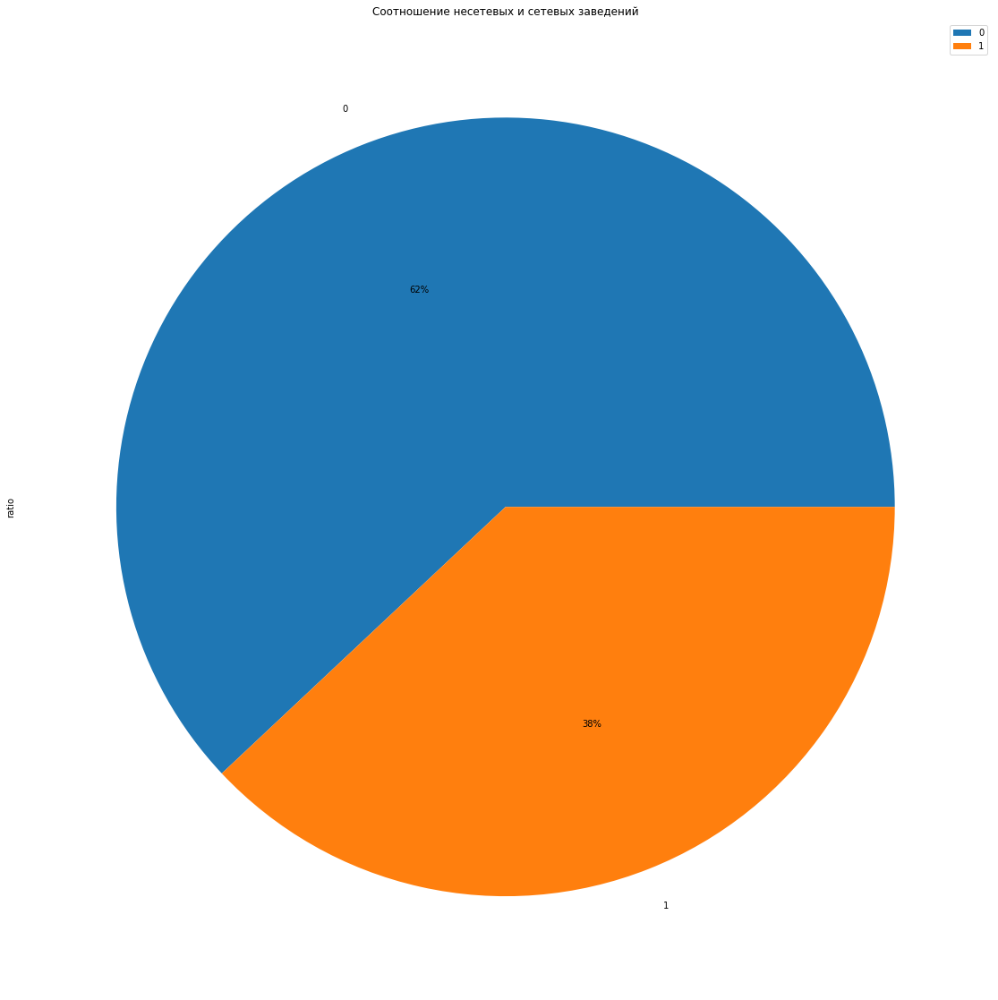

In [76]:
rest_chain=rest.pivot_table(index='chain',values='name',aggfunc='count')
rest_chain.columns=['rest_count']
rest_chain['ratio']=round(rest_chain['rest_count']*100/8406)
print(rest_chain)
rest_chain.plot(kind='pie',x='chain',y='ratio',figsize=(20, 20),autopct='%1.0f%%')
plt.title('Соотношение несетевых и сетевых заведений')
plt.show()

Посмотрим какие категории заведений чаще являются сетевыми.

Изучим распределение сетевых и не сетевых заведений в зависимости от категории. 

Небольшое преобладание сетевых заведений мы видим в категориях "пиццерии", "кофейня" и "булочная". Во всех остальных категориях преобладают не сетевые заведения. Сильная разница наблюдается в категории "бар, паб", 596 против 169. В категории "кафе" 1599 против 779. "рестораны" 1313 против 730. "столовая" 227 и 88 соответственно. Посмотрим долю сетевых и несетевых заведений по категориям.

Вывод: чаще всего являются сетевыми пиццерии, кофейни и булочные. Так же значительная доля сетевых заведений среди заведений быстрого питания. Меньше половины от общего числа заведений являются сетевыми среди заведений категории  бар,паб, кафе и столовая. Так же сильное отставание наблюдается среди ресторанов. В этих категориях чаще растространены заведения не сетевого типа.

['бар,паб' 'булочная' 'быстрое питание' 'кафе' 'кофейня' 'пиццерия'
 'ресторан' 'столовая']
           category  chain  name  rest_count      ratio
0           бар,паб      0   596         765  77.908497
1           бар,паб      1   169         765  22.091503
2          булочная      0    99         256  38.671875
3          булочная      1   157         256  61.328125
4   быстрое питание      0   371         603  61.525705
5   быстрое питание      1   232         603  38.474295
6              кафе      0  1599        2378  67.241379
7              кафе      1   779        2378  32.758621
8           кофейня      0   693        1413  49.044586
9           кофейня      1   720        1413  50.955414
10         пиццерия      0   303         633  47.867299
11         пиццерия      1   330         633  52.132701
12         ресторан      0  1313        2043  64.268233
13         ресторан      1   730        2043  35.731767
14         столовая      0   227         315  72.063492
15         с

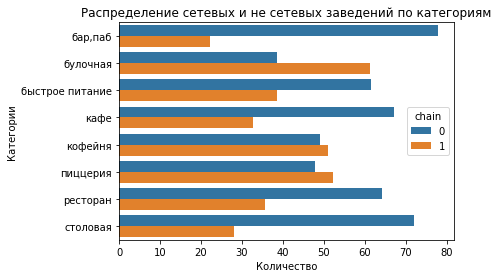

In [84]:
rest_chain_0=rest.groupby(['category','chain'],as_index=False)[['name']].count()    
print(rest_chain_0['category'].unique())
#print(rest_chain_0)
rest_chain_0_1=pd.merge(rest_chain_0,rest_category)
rest_chain_0_1['ratio']=rest_chain_0_1['name']*100/rest_chain_0_1['rest_count']
print(rest_chain_0_1)
sns.barplot(x='ratio',y='category',hue='chain',data=rest_chain_0_1)
plt.title('Распределение сетевых и не сетевых заведений по категориям')
plt.xlabel('Количество')
plt.ylabel('Категории')
plt.show()

#### Топ-15 заведений Москвы 

Посмотрим 15 самых популярных сетевых заведений в Москве и проанализируем к каким категориям они относятся.

Самой распространенной сетью оказалась кофейня "Шоколадница. Действительно это очень популярная сеть кофеен в Москве. Следом идут пиццерии "Домино'с Пицца" и "Додо пицца".
 В список так же попали такие небольшие но очень распространенные кофейни как "One price coffee" и "Cofix"

                                              address
name                                category         
шоколадница                         кофейня       119
домино'с пицца                      пиццерия       76
додо пицца                          пиццерия       74
one price coffee                    кофейня        71
яндекс лавка                        ресторан       69
cofix                               кофейня        65
prime                               ресторан       49
кофепорт                            кофейня        42
кулинарная лавка братьев караваевых кафе           39
теремок                             ресторан       36
cofefest                            кофейня        31
чайхана                             кафе           26
буханка                             булочная       25
drive café                          кафе           24
кофемания                           кофейня        22


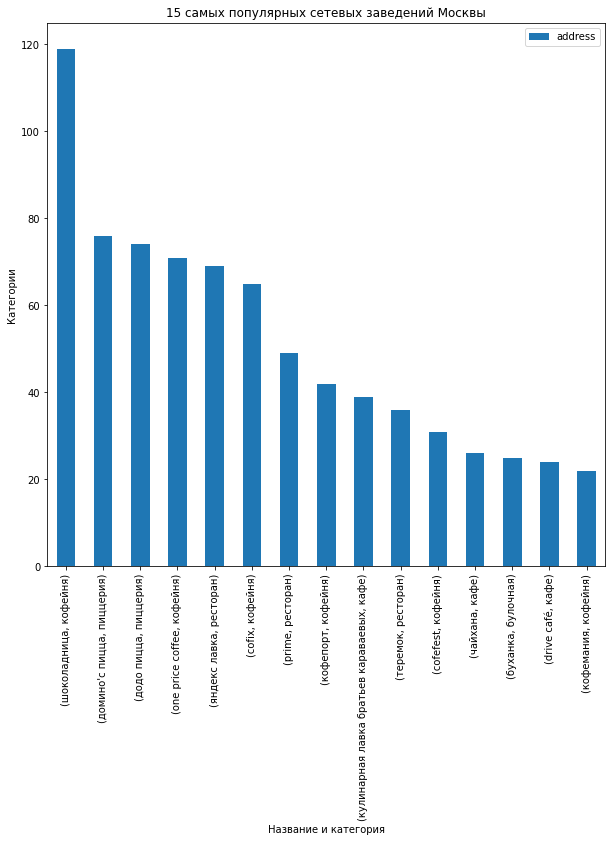

In [13]:
rest_name_1=rest.query('chain ==1')
rest_name=rest_name_1.pivot_table(index=['name','category'],values='address',aggfunc='count')
rest_name=rest_name.sort_values(by='address',ascending=False).head(15)
print(rest_name)
rest_name.plot(kind='bar',figsize=(10, 10),y='address')
plt.title('15 самых популярных сетевых заведений Москвы')
plt.xlabel('Название и категория')
plt.ylabel('Категории')
plt.show()

#### Изучение заведений в зависимости от района 

Посмотрим распределение общего количества заведений в зависимости от округа Москвы.

Для наглядности построим столбчатую диаграмму.

Из графика хорошо видно что больше всего заведений распологается в Центральном округе, 2242 заведения. Этот показатель значительно выше чем по всем остальным округам Москвы. От 850 до 900 заведений распологается в Северном, Южном, Северо-Восточном и Восточном округах. При этом меньше всего заведений открыто в Северо-Западном округе Москвы, 409.

                                  district  address
0       Центральный административный округ     2242
1          Северный административный округ      900
2             Южный административный округ      892
3  Северо-Восточный административный округ      891
4          Западный административный округ      851
5         Восточный административный округ      798
6     Юго-Восточный административный округ      714
7      Юго-Западный административный округ      709
8   Северо-Западный административный округ      409


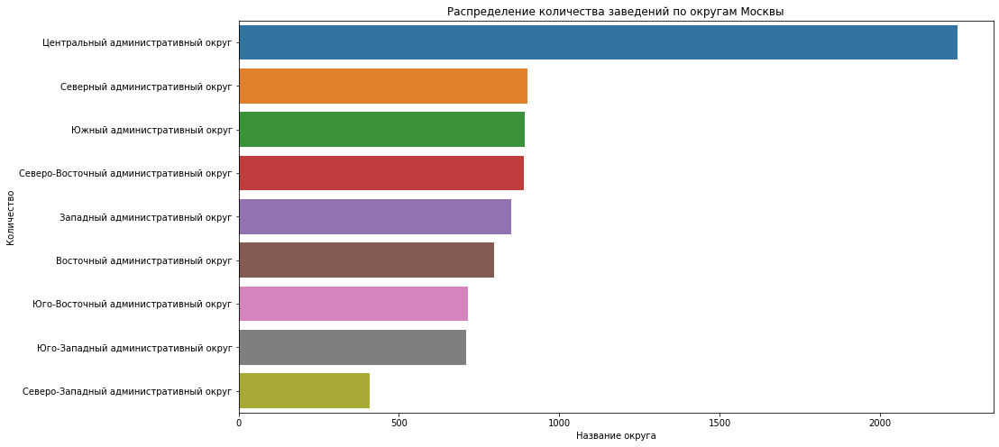

In [14]:
rest_district=rest.pivot_table(index=['district'],values='address',aggfunc='count')
rest_district=rest_district.sort_values(by='address',ascending=False)
rest_district=rest_district.reset_index()
print(rest_district)
plt.figure(figsize=(15,8))
sns.barplot(x='address',y='district',data=rest_district)
plt.title('Распределение количества заведений по округам Москвы')
plt.xlabel('Название округа')
plt.ylabel('Количество')
plt.show()

Теперь посмотрим распределение заведений по округам Москвы в зависимости от категории.

Для наглядности построим диаграмму. 

Видно что во всех округах кроме центрального кафе преобладают по количеству. Тогда как в центральном наблюдается максимальное количество ресторанов. Так же Центральный район сильно выделяется количеством баров/пабов, их значительно больше чем в прочих округах.  

Это можно объяснить тем, что Центральный округ является центром притяжения культурной и развлекательной жизни города, тогда как другие округа имеют больше территорий "спальных районов".

                           district         category  address      ratio
0  Восточный административный округ          бар,паб       53   6.641604
1  Восточный административный округ         булочная       25   3.132832
2  Восточный административный округ  быстрое питание       71   8.897243
3  Восточный административный округ             кафе      272  34.085213
4  Восточный административный округ          кофейня      105  13.157895
5  Восточный административный округ         пиццерия       72   9.022556
6  Восточный административный округ         ресторан      160  20.050125
7  Восточный административный округ         столовая       40   5.012531


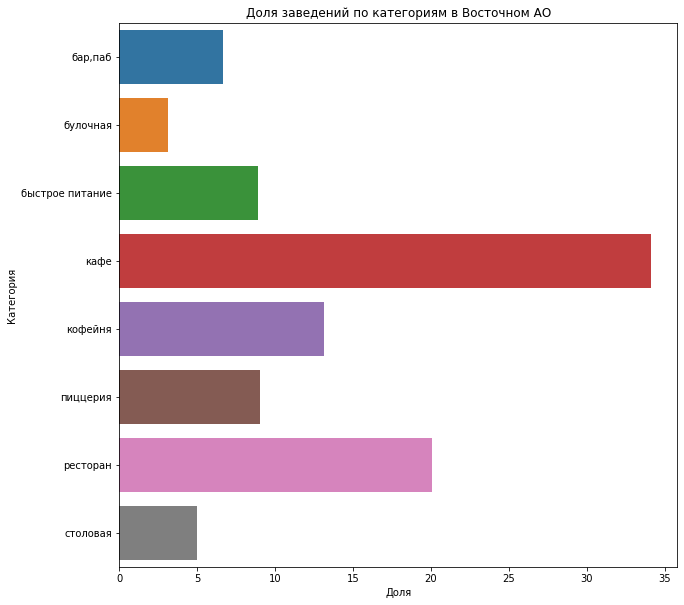

In [15]:
rest_district_category=rest.groupby(['district','category'],as_index=False)[['address']].count()
rest_district_category_v=rest_district_category.query('district=="Восточный административный округ"')
rest_district_category_v['ratio']=rest_district_category_v['address']*100/798
print(rest_district_category_v)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_v)
plt.title('Доля заведений по категориям в Восточном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                           district         category  address      ratio
8   Западный административный округ          бар,паб       50   5.875441
9   Западный административный округ         булочная       37   4.347826
10  Западный административный округ  быстрое питание       62   7.285546
11  Западный административный округ             кафе      239  28.084606
12  Западный административный округ          кофейня      150  17.626322
13  Западный административный округ         пиццерия       71   8.343126
14  Западный административный округ         ресторан      218  25.616921
15  Западный административный округ         столовая       24   2.820212


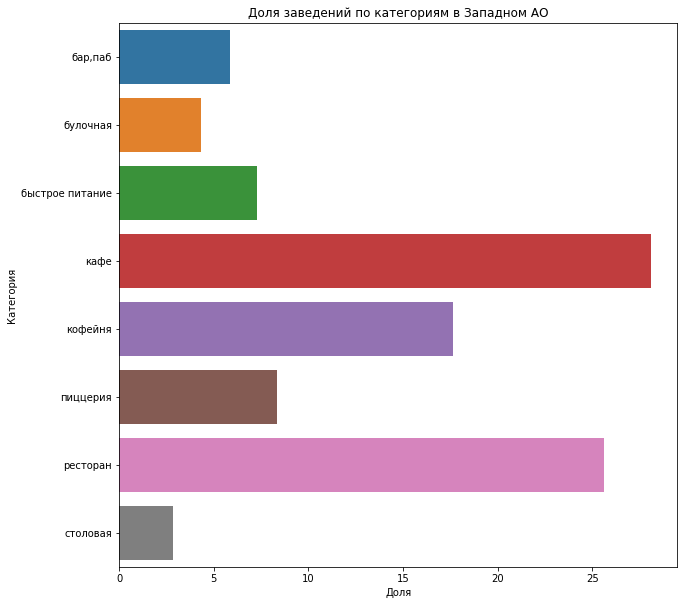

In [16]:
rest_district_category_z=rest_district_category.query('district=="Западный административный округ"')
rest_district_category_z['ratio']=rest_district_category_z['address']*100/851
print(rest_district_category_z)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_z)
plt.title('Доля заведений по категориям в Западном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                           district         category  address      ratio
16  Северный административный округ          бар,паб       68   7.555556
17  Северный административный округ         булочная       39   4.333333
18  Северный административный округ  быстрое питание       58   6.444444
19  Северный административный округ             кафе      235  26.111111
20  Северный административный округ          кофейня      193  21.444444
21  Северный административный округ         пиццерия       77   8.555556
22  Северный административный округ         ресторан      189  21.000000
23  Северный административный округ         столовая       41   4.555556


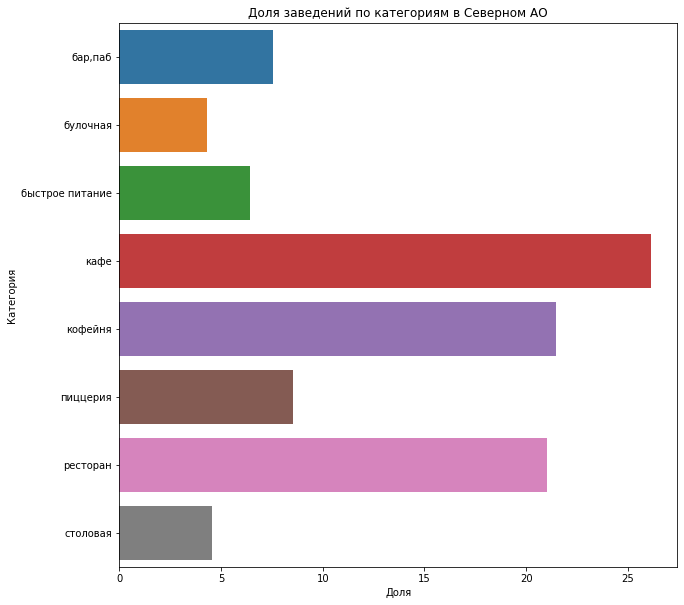

In [17]:
rest_district_category_s=rest_district_category.query('district=="Северный административный округ"')
rest_district_category_s['ratio']=rest_district_category_s['address']*100/900
print(rest_district_category_s)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_s)
plt.title('Доля заведений по категориям в Северном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                                   district         category  address  \
24  Северо-Восточный административный округ          бар,паб       63   
25  Северо-Восточный административный округ         булочная       28   
26  Северо-Восточный административный округ  быстрое питание       82   
27  Северо-Восточный административный округ             кафе      269   
28  Северо-Восточный административный округ          кофейня      159   
29  Северо-Восточный административный округ         пиццерия       68   
30  Северо-Восточный административный округ         ресторан      182   
31  Северо-Восточный административный округ         столовая       40   

        ratio  
24   7.070707  
25   3.142536  
26   9.203143  
27  30.190797  
28  17.845118  
29   7.631874  
30  20.426487  
31   4.489338  


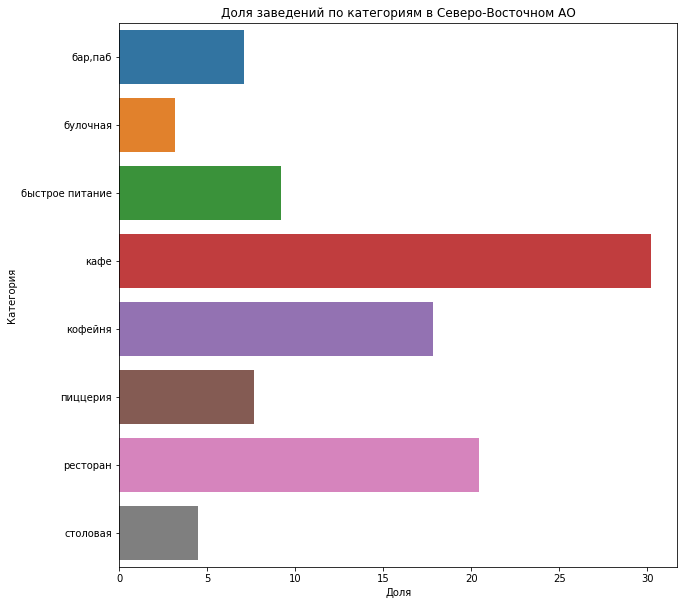

In [18]:
rest_district_category_sv=rest_district_category.query('district=="Северо-Восточный административный округ"')
rest_district_category_sv['ratio']=rest_district_category_sv['address']*100/891
print(rest_district_category_sv)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_sv)
plt.title('Доля заведений по категориям в Северо-Восточном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                                  district         category  address  \
32  Северо-Западный административный округ          бар,паб       23   
33  Северо-Западный административный округ         булочная       12   
34  Северо-Западный административный округ  быстрое питание       30   
35  Северо-Западный административный округ             кафе      115   
36  Северо-Западный административный округ          кофейня       62   
37  Северо-Западный административный округ         пиццерия       40   
38  Северо-Западный административный округ         ресторан      109   
39  Северо-Западный административный округ         столовая       18   

        ratio  
32   5.623472  
33   2.933985  
34   7.334963  
35  28.117359  
36  15.158924  
37   9.779951  
38  26.650367  
39   4.400978  


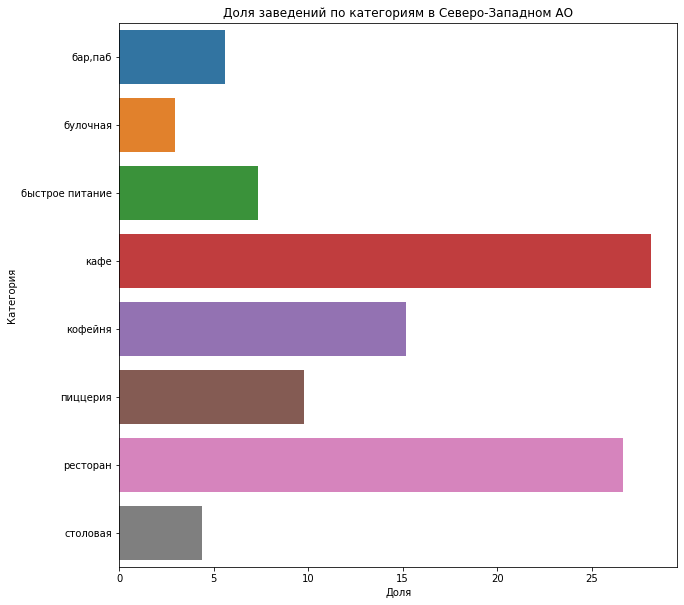

In [19]:
rest_district_category_sz=rest_district_category.query('district=="Северо-Западный административный округ"')
rest_district_category_sz['ratio']=rest_district_category_sz['address']*100/409
print(rest_district_category_sz)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_sz)
plt.title('Доля заведений по категориям в Северо-Западном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                              district         category  address      ratio
40  Центральный административный округ          бар,паб      364  16.235504
41  Центральный административный округ         булочная       50   2.230152
42  Центральный административный округ  быстрое питание       87   3.880464
43  Центральный административный округ             кафе      464  20.695807
44  Центральный административный округ          кофейня      428  19.090098
45  Центральный административный округ         пиццерия      113   5.040143
46  Центральный административный округ         ресторан      670  29.884032
47  Центральный административный округ         столовая       66   2.943800


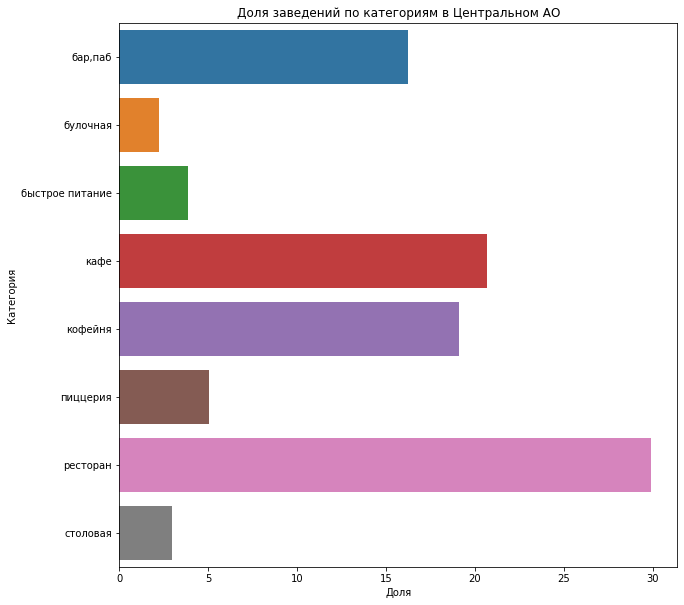

In [20]:
rest_district_category_c=rest_district_category.query('district=="Центральный административный округ"')
rest_district_category_c['ratio']=rest_district_category_c['address']*100/2242
print(rest_district_category_c)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_c)
plt.title('Доля заведений по категориям в Центральном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                                district         category  address      ratio
48  Юго-Восточный административный округ          бар,паб       38   5.322129
49  Юго-Восточный административный округ         булочная       13   1.820728
50  Юго-Восточный административный округ  быстрое питание       67   9.383754
51  Юго-Восточный административный округ             кафе      282  39.495798
52  Юго-Восточный административный округ          кофейня       89  12.464986
53  Юго-Восточный административный округ         пиццерия       55   7.703081
54  Юго-Восточный административный округ         ресторан      145  20.308123
55  Юго-Восточный административный округ         столовая       25   3.501401


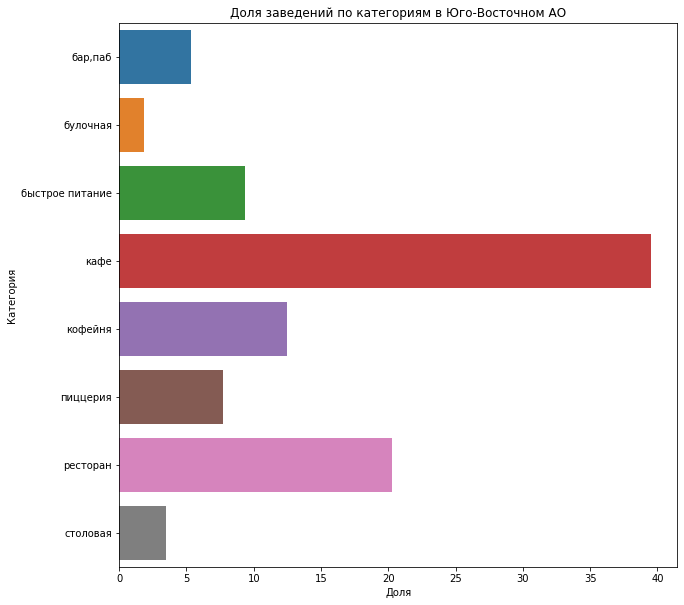

In [21]:
rest_district_category_yv=rest_district_category.query('district=="Юго-Восточный административный округ"')
rest_district_category_yv['ratio']=rest_district_category_yv['address']*100/714
print(rest_district_category_yv)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_yv)
plt.title('Доля заведений по категориям в Юго-Восточном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                               district         category  address      ratio
56  Юго-Западный административный округ          бар,паб       38   5.359661
57  Юго-Западный административный округ         булочная       27   3.808181
58  Юго-Западный административный округ  быстрое питание       61   8.603667
59  Юго-Западный административный округ             кафе      238  33.568406
60  Юго-Западный административный округ          кофейня       96  13.540197
61  Юго-Западный административный округ         пиццерия       64   9.026798
62  Юго-Западный административный округ         ресторан      168  23.695346
63  Юго-Западный административный округ         столовая       17   2.397743


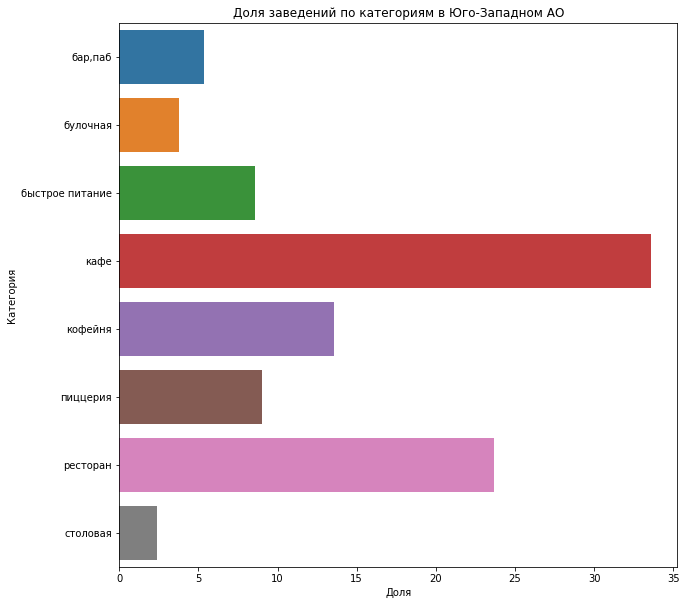

In [22]:
rest_district_category_yz=rest_district_category.query('district=="Юго-Западный административный округ"')
rest_district_category_yz['ratio']=rest_district_category_yz['address']*100/709
print(rest_district_category_yz)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_yz)
plt.title('Доля заведений по категориям в Юго-Западном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

                        district         category  address      ratio
64  Южный административный округ          бар,паб       68   7.623318
65  Южный административный округ         булочная       25   2.802691
66  Южный административный округ  быстрое питание       85   9.529148
67  Южный административный округ             кафе      264  29.596413
68  Южный административный округ          кофейня      131  14.686099
69  Южный административный округ         пиццерия       73   8.183857
70  Южный административный округ         ресторан      202  22.645740
71  Южный административный округ         столовая       44   4.932735


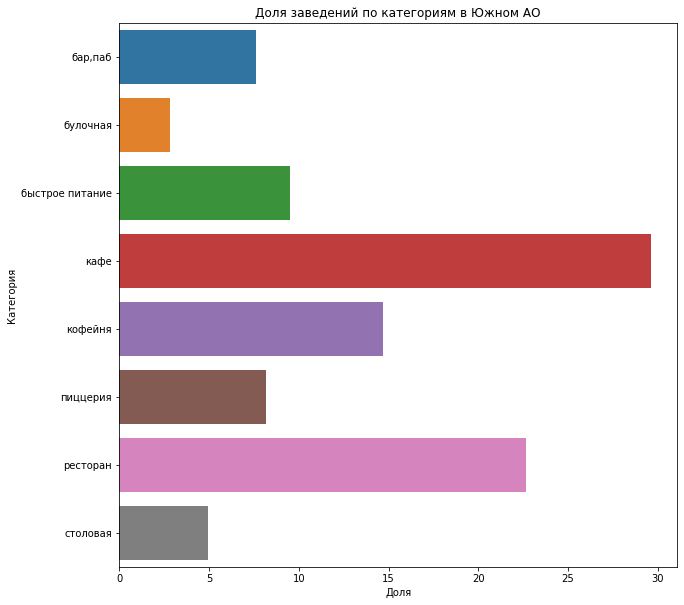

In [23]:
rest_district_category_y=rest_district_category.query('district=="Южный административный округ"')
rest_district_category_y['ratio']=rest_district_category_y['address']*100/892
print(rest_district_category_y)
plt.figure(figsize=(10,10))
sns.barplot(x='ratio',y='category',data=rest_district_category_y)
plt.title('Доля заведений по категориям в Южном АО')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

#### Изучение рейтингов для разных категорий заведений

Посмотрим на среднии рейтинги заведений в зависимости от категорий. Видим, что рейтинги различаются не так сильно. Максимальные рейтинги у баров/пабов, они имеют 4,38. Следом идут пиццерии и рестораны, 4,30 и 4,29 соответственно. Самые низкие рейтинги имеют заведения быстрого питания, 4,05.

Можно предположить что во многом рейтинги связаны с категорией заведения. Бары/пабы чаще всего посещают для развлечения. А веселые люди ставят более высокие оценки. Рестораны обычно имеют более дорогие интерьеры и высокое качество обслуживания, а соответственно и оценки. Кафе же напротив более будничный вариант, а к тому же таких заведений больше всего. Заведения быстрого питания же включают такие заведения как шаурму и подобные, чаще всего в таких заведениях ориентируются на быстрое обслуживание и смену клиентов, в них не так уютно находиться длительное время.

                     mean
category                 
бар,паб          4.387712
пиццерия         4.301264
ресторан         4.290357
кофейня          4.277282
булочная         4.268359
столовая         4.211429
кафе             4.123886
быстрое питание  4.050249


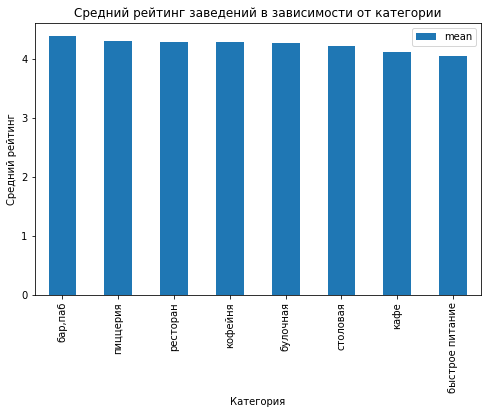

In [24]:
rest_rating=rest.pivot_table(index='category',values='rating',aggfunc='mean')
rest_rating.columns=['mean']
rest_rating=rest_rating.sort_values(by='mean',ascending=False)
print(rest_rating)
rest_rating.plot(kind='bar',figsize=(8, 5),y='mean')
plt.title('Средний рейтинг заведений в зависимости от категории')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.show()

In [25]:
rating_rest=rest.groupby('district', as_index=False)['rating'].agg('mean')
print(rating_rest)
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_rest,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

                                  district    rating
0         Восточный административный округ  4.174185
1          Западный административный округ  4.181551
2          Северный административный округ  4.239778
3  Северо-Восточный административный округ  4.148260
4   Северо-Западный административный округ  4.208802
5       Центральный административный округ  4.377520
6     Юго-Восточный административный округ  4.101120
7      Юго-Западный административный округ  4.172920
8             Южный административный округ  4.184417


#### Кластеры заведений на карте

Отметим все заведения Москвы кластерами на карте. Так мы наглядно видим как распределяются заведения по кате, где их достаточное количество, а где совсем не много.

In [26]:
from folium import Map, Marker
from folium.plugins import MarkerCluster
moscow_lat, moscow_lng = 55.751244, 37.618423
ms = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(ms)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
rest.apply(create_clusters, axis=1)
ms

#### Топ-15 улиц по количеству заведений

Посмотрим она каких улицах находится больше всего заведений. 

Больше всего заведений открыто на Проспекте Мира, 184 заведения. Так же большая концентрация заведений наблюдается на следующих улицах : Профсоюзная, Проспект Вернадского, Ленинский проспект. Замыкает топ-15 Пятницкая улица, на ней распологается 48 заведений. 

Внимательнее посмотрев на данный список улиц, можно сказать что все эти улицы имеют большую протяженность. Среди них много шоссе и проспектов, а так же сюда попадает МКАД. Во многом это объясняет большое количество заведений на них. Выделяется Пятницкая улица, она имеет меньшую протяженность. Но она каходится в центральном округе, где высокая концентрация заведени.

                     street_1  name
800             проспект мира   184
804         профсоюзная улица   122
797      проспект вернадского   108
527        ленинский проспект   107
525    ленинградский проспект    95
378         дмитровское шоссе    88
459           каширское шоссе    77
308          варшавское шоссе    75
526       ленинградское шоссе    69
601                      мкад    65
546          люблинская улица    60
1027           улица вавилова    55
519      кутузовский проспект    54
1182     улица миклухо-маклая    49
811           пятницкая улица    48


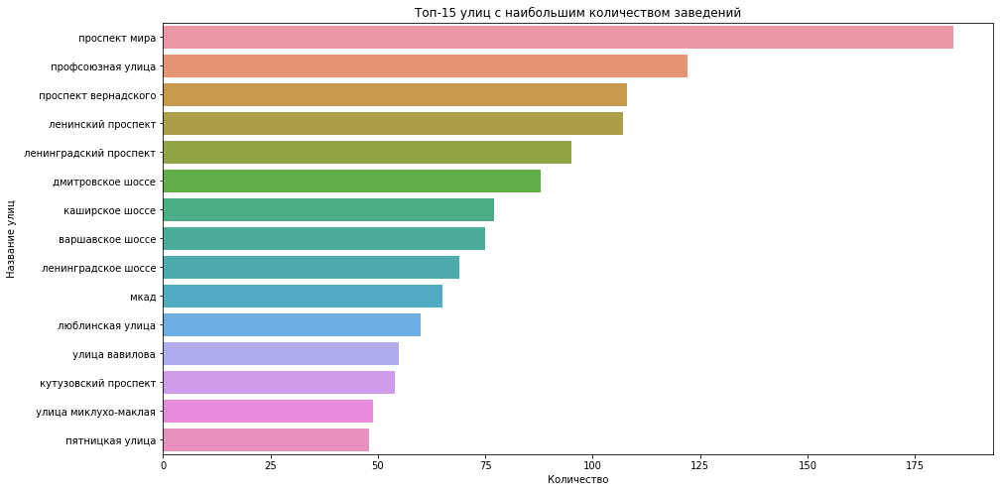

In [68]:
rest_street=rest.groupby(['street'],as_index=False)[['name']].count()
rest_street=rest_street.sort_values(by='name',ascending=False).head(15)
rest_street=rest_street.rename(columns={'street':'street_1'})
print(rest_street)
plt.figure(figsize=(15,8))
sns.barplot(x='name',y='street_1',data=rest_street)
plt.title('Топ-15 улиц с наибольшим количеством заведений')
plt.xlabel('Количество')
plt.ylabel('Название улиц')
plt.show()

Теперь посмотрим на распределение заведений по категориям на топ-15 улицах.

Почти на каждой улице лидируют кафе. Сильное преобладание кафе наблюдается на МКАД, так же здесь совсем отсутствуют столовые. На Пятницкой улице и Варшавском шоссе преобладают рестораны. А на Ленинградском проспекте рестораны и кофейни. Так же совсем отсутствуют столовые на Вавилова и Пятницкой. А на Каширском и Варшавском шоссе нет булочных.

,street,category,count,street_1,name,ratio
0,варшавское шоссе,"бар,паб",6,варшавское шоссе,75,8.000000
1,варшавское шоссе,быстрое питание,7,варшавское шоссе,75,9.333333
2,варшавское шоссе,кафе,17,варшавское шоссе,75,22.666667
3,варшавское шоссе,кофейня,14,варшавское шоссе,75,18.666667
4,варшавское шоссе,пиццерия,4,варшавское шоссе,75,5.333333
...,...,...,...,...,...,...
106,улица миклухо-маклая,быстрое питание,4,улица миклухо-маклая,49,8.163265
107,улица миклухо-маклая,кафе,21,улица миклухо-маклая,49,42.857143
108,улица миклухо-маклая,кофейня,4,улица миклухо-маклая,49,8.163265
109,улица миклухо-маклая,пиццерия,2,улица миклухо-маклая,49,4.081633


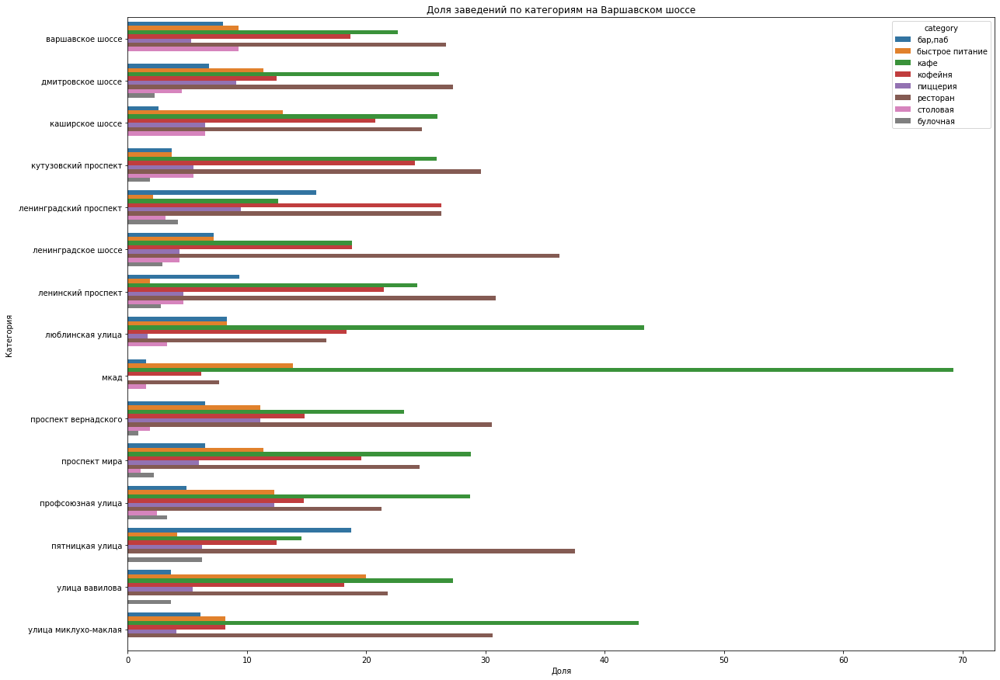

In [101]:
rest_street_category=rest.query('street in @rest_street.street_1')
rest_street_category_1=rest_street_category.groupby(['street','category'])[['name']].count()
rest_street_category_1.columns=['count']
rest_street_category_1=rest_street_category_1.reset_index()
rest_street_category_1_0=pd.merge(rest_street_category_1,rest_street,left_on='street',right_on='street_1')
rest_street_category_1_0['ratio']=rest_street_category_1_0['count']*100/rest_street_category_1_0['name']
display(rest_street_category_1_0)
plt.figure(figsize=(20,15))
sns.barplot(x='ratio',y='street',hue='category',data=rest_street_category_1_0)
plt.title('Доля заведений по категориям на Варшавском шоссе')
plt.xlabel('Доля')
plt.ylabel('Категория')
plt.show()

#### Улицы, на которых находится по одному заведений

Посмотрим на улицы на которых распологается по одному заведению. Таких улиц большое количество, 424. Внимательнее посмотрев на них, можно сказать что среди них преобладают небольшие улицы, переулки и тупики находящиеся вне Центрального округа, а скорее относящиеся к спальным либо промышленным районам.

In [50]:
rest_street=rest.groupby(['street'],as_index=False)[['name']].count()
rest_street_1=rest_street.query('name==1')
print(rest_street_1['street'].count())

424


#### Извучение среднего чека заведений.

Теперь изучим ценовую политику заведнений в зависимости от округа, в котором они находятся. 

Посчитаем медианное значение среднего чека в зависимости от округа. Самый высокий чек в Центральном и Западном округах, 1000 рублей. Чеки в диапозоне от 700 до 550 имеют Восточный, Северный, Северо-Западный и Юго-Западный округа. Минимальныя стоимость будет в Юго-Восточном округе, 450 рублей.

Для наглядности нанесем информацию на карту.

In [51]:
rest_bill=rest.groupby(['district'],as_index=False)['middle_avg_bill'].agg('median')
print(rest_bill)
with open('/datasets/admin_level_geomap.geojson', 'r') as fa:
    geo_json = json.load(fa)
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
mf = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rest_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(mf)
mf

                                  district  middle_avg_bill
0         Восточный административный округ            575.0
1          Западный административный округ           1000.0
2          Северный административный округ            650.0
3  Северо-Восточный административный округ            500.0
4   Северо-Западный административный округ            700.0
5       Центральный административный округ           1000.0
6     Юго-Восточный административный округ            450.0
7      Юго-Западный административный округ            600.0
8             Южный административный округ            500.0


<div class="alert alert-success" style="border-radius: 15px; box-shadow: 4px 4px 4px; border: 1px solid " ><b> ⬆ Комментарии от ревьюера ✔️ : </b> 

Здесь всё отлично. Так держать! Получилось очень хорошо
   
</div>

### ВЫВОД :
Исследование рынка Москвы.
Изучив информацию о заведениях общепита в Москве мы нашли следующее интересные особенности и получили следующие результаты: 

1.4.1  Категории заведений

В Москве  встречаются следующие категории заведений 'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб','быстрое питание', 'булочная', 'столовая'. Всего в Москве насчитывается 8406 заведений.

Больше всего заведений в категории "кафе", их 2378 штук. Далее по распространенности идут "рестораны", 2043 штуки. Чуть меньше заведений с категорией "кофейня", 1413 штук. Не много заведениий с категорией "столовая", их 315 штук. Меньше всего открыто "булочная", 256 штук.

Посмотрим какой  процентр от общего колличества заведений составляет та или иная категория:

                                       
кафе     2378 / 28.0

ресторан  2043 / 24.0

кофейня  1413 / 17.0

бар,паб  765 / 9.0

пиццерия  633 / 8.0

быстрое питание  603 / 7.0

столовая   315 / 4.0

булочная   256 / 3.0

Для наглядности мы построили круговую диаграмму в исследовании.

1.4.2  Количества посадочных мест в зависимости от категории заведения:

Мы построили таблицу, где будет видно колличество заведений в каждой категории и общее колличество посадочных мест в этих заведениях.

Соблюдена закономерность, что чем больше заведений, тем больше и посадочных мест. Самой популяной категорией у нас оказались кафе, но к сожалению для многих из них не было указано кличество посадочных мест. Самая полная информация оказалась лоя ресторанов. Тут количество посадочных мест указано для 1270 заведений, и посадочных мест в среднем 86. В кафе эта информация указана для 1218 заведений, среднее количество посадочных мест 60. Меньше всего булочных 148 штук, посадочных мест 50.

Это объясняется тем, что рестораны обычно имеют большие площади и расчитаны на большое количество посетителей. Тогда как кафе бывают как среднего размера, так и совсем не большие.

                            
ресторан        1270 / 86.0

кафе           1218 / 82.5

кофейня         751 / 80.0

бар,паб         468 / 75.5

пиццерия        427 / 65.0

быстрое питание  349 / 60.0

столовая        164 / 55.0

булочная        148 / 50.

1.4.3  Сетевые и не сетевые заведения:

Сравнив количество не сетевых и сетевых заведений в датасете мы видим, что не сетевых заведений 5201, в то время как сетевых 3205. Посчитав соотношение получим, что не сетевых заведени 62%, а сетевых 38%. Т.е. доля не сетевых заведений выше.

Для наглядности построили  круговую диаграммув исследовании.

1.4.3.1 Распределение сетевых и не сетевых заведений в зависимости от категории:

Посмотрим какие категории заведений чаще являются сетевыми.

Небольшое преобладание сетевых заведений мы видим в категориях "пиццерии", "кофейня" и "булочная". Во всех остальных категориях преобладают не сетевые заведения. Сильная разница наблюдается в категории "бар, паб", 596 не сетевых против 169 сетевых. В категории "кафе" 1599 против 779. "Рестораны" 1313 против 730. "столовая" 227 и 88 соответственно. Доля несетевых/сетевых заведений по категориям такова:

бар,паб        78/22 

булочная       39/61

быстрое питание 62/38

кафе          67/33

кофейня       49/51

пиццерия      48/52

ресторан       64/36

столовая       72/28

Чаще всего являются сетевыми пиццерии, кофейни и булочные. Так же значительная доля сетевых заведений среди заведений быстрого питания. Меньше половины от общего числа заведений являются сетевыми среди категории бар,паб, кафе и столовая. Так же сильное отставание наблюдается среди ресторанов. В этих категориях чаще растространены заведения не сетевого типа.

1.4.4  Топ-15 сетевых заведений Москвы:

Посмотрев 15 самых популярных сетевых заведений в Москве и проанализировав к каким категориям они относятся мы получили следующее:

Самой распространенной сетью оказалась кофейня "Шоколадница. Действительно это очень популярная сеть кофеен в Москве. Следом идут пиццерии "Домино'с Пицца" и "Додо пицца".
 В список так же попали такие небольшие но очень распространенные кофейни как "One price coffee" и "Cofix"
 
шоколадница                         кофейня       119
 
домино'с пицца                      пиццерия       76

додо пицца                         пиццерия       74

one price coffee                 кофейня        71

яндекс лавка                         ресторан       69

cofix                             кофейня        65

prime                             ресторан       49

кофепорт                          кофейня        42

кулинарная лавка братьев караваевых     кафе           39

теремок                            ресторан       36

cofefest                          кофейня        31

чайхана                             кафе           26

буханка                             булочная       25

drive café                        кафе           24

кофемания                           кофейня        22
 

1.4.5  Количество заведений  в зависимости от округа:

Посмотрим распределение общего количества заведений в зависимости от округа Москвы.Для наглядности мы построили  столбчатую диаграмму в исследовании.

Хорошо видно что больше всего заведений распологается в Центральном округе, 2242 заведения. Этот показатель значительно выше чем по всем остальным округам Москвы. От 850 до 900 заведений распологается в Северном, Южном, Северо-Восточном и Восточном округах. При этом меньше всего заведений открыто в Северо-Западном округе Москвы, 409.

1.4.5.1 Теперь посмотрим распределение заведений по округам Москвы в зависимости от категории:

Для наглядности построим диаграмму.

Видно что во всех округах кроме центрального кафе преобладают по количеству. Тогда как в центральном наблюдается максимальное количество ресторанов. Так же Центральный район сильно выделяется количеством баров/пабов, их значительно больше чем в прочих округах.

Это можно объяснить тем, что Центральный округ является центром притяжения культурной и развлекательной жизни города, тогда как другие округа имеют больше территорий "спальных районов".

1.4.6  Среднии рейтинги для разных категорий заведений:

Посмотрим на среднии рейтинги заведений в зависимости от категорий.
                 
бар,паб         4.387712

пиццерия        4.301264

ресторан        4.290357

кофейня        4.277282

булочная       4.268359

столовая        4.211429

кафе           4.123886

быстрое питание  4.050249

Видим, что рейтинги различаются не так сильно. Максимальные рейтинги у баров/пабов, они имеют 4,38. Следом идут пиццерии и рестораны, 4,30 и 4,29 соответственно. Самые низкие рейтинги имеют заведения быстрого питания, 4,05.

Предположим, что во многом рейтинги связаны с категорией заведения. Бары/пабы чаще всего посещают для развлечения. Веселые люди ставят более высокие оценки. Рестораны обычно имеют более дорогие интерьеры и высокое качество обслуживания, а соответственно и оценки. Кафе же, напротив более будничный вариант, а к тому же таких заведений больше всего. Заведения быстрого питания включают такие заведения как шаурму и подобные, чаще всего в таких заведениях ориентируются на быстрое обслуживание и смену клиентов, в них не так уютно находиться длительное время, а сервис более низкого уровня.

1.4.7  Средний рейтинг заведений по районам:
Для наглядности мы построили хороплет в исследовании.

Максимальный рейтинг имеют заведения центрального округа. Минимальные же оценки достались заведениям Северо-Восточного и Юго-Восточного округов.

Восточный административный округ       4.3

Западный административный округ        4.3

Северный административный округ        4.3

Северо-Восточный административный округ 4.2

Северо-Западный административный округ  4.3

Центральный административный округ     4.4

Юго-Восточный административный округ   4.2

Юго-Западный административный округ    4.3

Южный административный округ          4.3

1.4.8  Кластеры заведений на карте:

Мы отметили все заведения Москвы кластерами на карте. Так мы наглядно видим как распределяются заведения по карте, где высокая концентрация, а где заведений совсем не много.

На карте хорошо заметно, что основная концентрация заведений в центре города. При этом чем ближе к окраинам, тем  заведений становится все меньше.

1.4.9  Топ-15 улиц по количеству заведений:

Больше всего заведений открыто на Проспекте Мира, 184 заведения. Так же большая концентрация заведений наблюдается на следующих улицах : Профсоюзная, Проспект Вернадского, Ленинский проспект. Замыкает топ-15 Пятницкая улица, на ней распологается 48 заведений.

Посмотрев на данный список, можно сказать что все эти улицы имеют большую протяженность. Среди них много шоссе и проспектов, а так же сюда попадает МКАД. Во многом это объясняет большое количество заведений на них. Выделяется Пятницкая улица, она имеет меньшую протяженность, но она каходится в центральном округе, где высокая концентрация заведений.

Теперь посмотрим на распределение заведений по категориям на  этих топ-15 улицах:

Почти на каждой улице лидируют кафе. Сильное преобладание кафе наблюдается на МКАД, так же здесь совсем отсутствуют столовые. На Пятницкой улица и Варшавском шоссе преобладают рестораны. А на Ленинградском проспекте рестораны и кофейни. Так же совсем отсутствуют столовые на Вавилова и Пятницкой. А на Каширском и Варшавском шоссе нет булочных.

1.4.10  Улицы, на которых находится по одному заведений:

Таких улиц большое количество. Внимательнее посмотрев на них, можно сказать что среди них преобладают небольшие улицы, переулки и тупики находящиеся вне Центрального округа, а скорее относящиеся к спальным либо промышленным районам.

1.4.11  Среднего чека заведений по округам:

 Самый высокий чек в Центральном и Западном округах, 1000 рублей. Чеки в диапозоне от 700 до 550 имеют Восточный, Северный, Северо-Западный и Юго-Западный округа. Минимальныя стоимость будет в Юго-Восточном округе, 450 рублей.
 
Восточный административный округ         575.0

Западный административный округ          1000.0

Северный административный округ          650.0

Северо-Восточный административный округ   500.0

Северо-Западный административный округ    700.0

Центральный административный округ       1000.0

Юго-Восточный административный округ     450.0

Юго-Западный административный округ      600.0

Южный административный округ           500.0

## Открытие кофейни

В ходе исследования необходимо ответьтить на следующие вопросы:

Сколько всего кофеен? В каких районах их больше всего, каковы особенности их расположения?

Есть ли круглосуточные кофейни?

Какие у кофеен рейтинги? Как они распределяются по районам?

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Создадим отдельный датасет с кофейнями.

Всего в списке 1413 кофеен.

In [52]:
rest_coffee=rest.query('category in "кофейня"')
print(rest_coffee.count())

name                 1413
category             1413
address              1413
district             1413
hours                1413
lat                  1413
lng                  1413
rating               1413
price                1413
avg_bill             1413
middle_avg_bill       200
middle_coffee_cup     521
chain                1413
seats                 751
street               1389
is_24/7              1413
dtype: int64


### Посмотрим как кофейни распределены по округам

Создадим таблицу с округами и количеством кофеен в них.

Для наглядности построим столбчатую диаграмму.

Хорошо видно что со значительным отрывом по количеству кофеен лидирует Центральный округ, в нем 428 кофеен. Следом с отставанием более 50% идет Северный округ с 193 кофейнями. Меньше всего кофеен в Северо-Западном округе, их 62.

                                  district  count
5       Центральный административный округ    428
2          Северный административный округ    193
3  Северо-Восточный административный округ    159
1          Западный административный округ    150
8             Южный административный округ    131
0         Восточный административный округ    105
7      Юго-Западный административный округ     96
6     Юго-Восточный административный округ     89
4   Северо-Западный административный округ     62


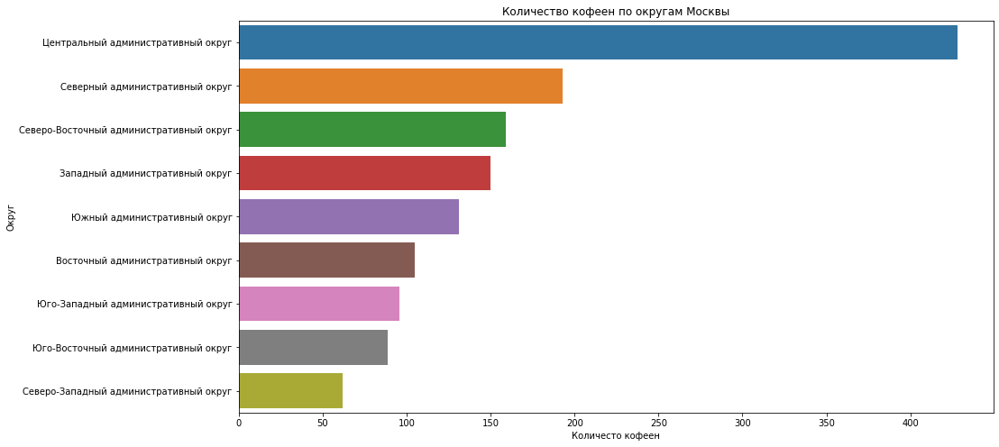

In [53]:
rest_coffee_area=rest_coffee.pivot_table(index='district',values='name',aggfunc='count')
rest_coffee_area.columns=['count']
rest_coffee_area=rest_coffee_area.reset_index()
rest_coffee_area=rest_coffee_area.sort_values(by='count',ascending=False)
print(rest_coffee_area)
plt.figure(figsize=(15,8))
sns.barplot(x='count',y='district',data=rest_coffee_area)
plt.title('Количество кофеен по округам Москвы')
plt.xlabel('Количесто кофеен')
plt.ylabel('Округ')
plt.show()

На карте хорошо видно сосредоточение кофеен в центральном районе.

In [54]:
with open('/datasets/admin_level_geomap.geojson', 'r') as fa:
    geo_json = json.load(fa)
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
mfs = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rest_coffee_area,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по округам Москвы',
).add_to(mfs)
mfs

###  Круглосуточные кофейни
 Посмотрим какие вообще режимы работы встречаются среди кофеен.
 Выделим среди них только те, в которых встречается "круглосуточно".и Таких кофеен оказалось совсем не много, всего 76 от общего количества. Это всего 5,3%. При этом стоит понимать, что круглосуточный режим работы далеко не у всех таких кофеен будет ежедневный, многие работают в круглосуточном режиме например только в субботу или пятницу. 

In [55]:
rest_coffee['hours'].unique()
rest_coffee['is_24']=rest_coffee['hours'].str.contains('круглосуточно')
print(rest_coffee[rest_coffee['is_24']==True]['is_24'].count())

76


### Средний рейтинг коффеен по округам

Сгруппируем кофейни по округам и посчитаем средний рейтинг.

Видим что рейтинги не имеют ярковыраженной разницы. Но при этом максимальные рейтинги имеют кофейни Центрального округа, а минимальные оценки у заведений Западного. 

In [56]:
rest_coffee_rating=rest_coffee.pivot_table(index='district',values='rating',aggfunc='mean') 
rest_coffee_rating.columns=['mean_rating']
rest_coffee_rating=rest_coffee_rating.reset_index()
rest_coffee_rating=rest_coffee_rating.sort_values(by='mean_rating',ascending=False)
print(rest_coffee_rating)

                                  district  mean_rating
5       Центральный административный округ     4.336449
4   Северо-Западный административный округ     4.325806
2          Северный административный округ     4.291710
7      Юго-Западный административный округ     4.283333
0         Восточный административный округ     4.282857
8             Южный административный округ     4.232824
6     Юго-Восточный административный округ     4.225843
3  Северо-Восточный административный округ     4.216981
1          Западный административный округ     4.195333


Для наглядности нанесем информацию о рейтингах на карту

In [57]:
with open('/datasets/admin_level_geomap.geojson', 'r') as fa:
    geo_json = json.load(fa)
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rest_coffee_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средние рейтинги кофеен по округам Москвы',
).add_to(m)
m

### Средняя стоимость чашки кофе по округам
Самая дорогая чашка кофе в Западном округе, 189,93 рублей. Чуть меньше стоит чашка кофе в Центральном округе, 187,51 рубль. Минимальная стоимость чашки кофе в Юго-Восточном округе, 151,08 рублей

                                  district  mean_coffee_cup
1          Западный административный округ       189.938776
5       Центральный административный округ       187.518519
7      Юго-Западный административный округ       184.176471
0         Восточный административный округ       174.023810
2          Северный административный округ       165.789474
4   Северо-Западный административный округ       165.523810
3  Северо-Восточный административный округ       165.333333
8             Южный административный округ       158.488372
6     Юго-Восточный административный округ       151.088235


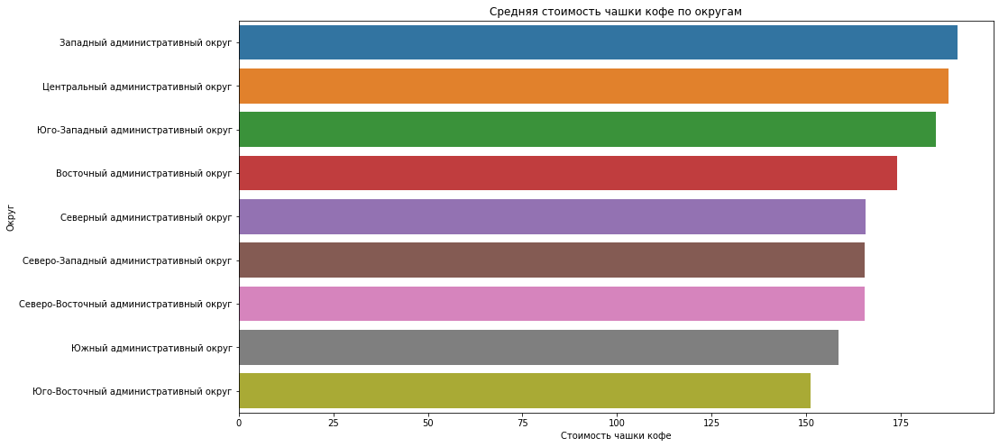

In [58]:
rest_coffee_cup=rest_coffee.pivot_table(index='district',values='middle_coffee_cup',aggfunc='mean')
rest_coffee_cup.columns=['mean_coffee_cup']
rest_coffee_cup=rest_coffee_cup.reset_index()
rest_coffee_cup=rest_coffee_cup.sort_values(by='mean_coffee_cup',ascending=False)
print(rest_coffee_cup)
plt.figure(figsize=(15,8))
sns.barplot(x='mean_coffee_cup',y='district',data=rest_coffee_cup)
plt.title('Средняя стоимость чашки кофе по округам')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Округ')
plt.show()

### Вывод:

В ходе исследования нам необходимо было ответьтить на следующие вопросы:

1 Сколько всего кофеен? В каких районах их больше всего, каковы особенности их расположения?

2 Есть ли круглосуточные кофейни?

3 Какие у кофеен рейтинги? Как они распределяются по районам?

Всего в списке для изучения 1413 кофеен.

2.1 Распределение кофейнен по округам

Хорошо видно что со значительным отрывом по количеству кофеен лидирует Центральный округ, в нем 428 кофеен. Следом с отставанием более 50% идет Северный округ с 193 кофейнями. Меньше всего кофеен в Северо-Западном округе, их 62.

Центральный административный округ     428

Северный административный округ        193

Северо-Восточный административный округ 159

Западный административный округ        150

Южный административный округ          131

Восточный административный округ        105

Юго-Западный административный округ     96

Юго-Восточный административный округ    89

Северо-Западный административный округ   62

Мы нанесли данную информацию на карту, а так же сделали диаграмму для визуализации.

2.3  Круглосуточные кофейни:

Таких кофеен оказалось совсем не много, всего 76 от общего количества. Это всего 5,3%. При этом стоит понимать, что круглосуточный режим работы далеко не у всех таких кофеен будет ежедневно, многие работают в круглосуточном режиме например только в субботу или пятницу. В основном же кофейни Москвы не работают круглосуточно.

2.4  Средний рейтинг кофеен по округам:

Рейтинги не имеют ярковыраженной разницы. При этом максимальные рейтинги имеют кофейни Центрального округа, а минимальные оценки у заведений Западного.

Центральный административный округ      4.336449

Северо-Западный административный округ   4.325806

Северный административный округ         4.291710

Юго-Западный административный округ     4.283333

Восточный административный округ        4.282857

Южный административный округ          4.232824

Юго-Восточный административный округ    4.225843

Северо-Восточный административный округ  4.216981

Западный административный округ         4.195333

Для наглядности нанесли информацию о рейтингах на карту в исследовании.

2.5  Средняя стоимость чашки кофе по округам:

Самая дорогая чашка кофе в Западном округе, 189,93 рублей. Чуть меньше стоит чашка кофе в Центральном округе, 187,51 рубль. Минимальная стоимость чашки кофе в Юго-Восточном округе, 151,08 рублей.

Западный административный округ       189.938776

Центральный административный округ    187.518519

Юго-Западный административный округ   184.176471

Восточный административный округ      174.023810

Северный административный округ       165.789474

Северо-Западный административный округ 165.523810

Северо-Восточный административный округ 165.333333

Южный административный округ         158.488372

Юго-Восточный административный округ   151.088235



Еще раз посмотрев на результаты исследования можно предположить, что наиболее удачными округами для открытия новой кофейни могут оказаться следующии:

1 Западный административный округ. в этом округе средняя конкуренция (150 заведений). При этом можно предположить, что заведения не слишком удовлетворяют потребности посетителей, так как рейтинг заведений в этом округе минимальный (4,19). Ну а средняя стоимость одной чашки кофе максимальна среди округов (189,93). Соответственно открыв крутую и доступную кофейню в этом районе, мы можем расчитывать на посетителей за счет качества и снижения цены. 

2 Северо-Западный административный округ. В этом округе наименьшая конкуренция (62 заведений). Это заведения среднего рейтинга (4,28). А средняя стоимость чашки кофе в районе составляет 165,52.  Открыв кофейню в этом районе, мы сможем расчитывать на посетителей за счет низкой конкуренции и выского качества.


Презентация: https://disk.yandex.ru/i/jSjCro2GiJfi4g